In [1]:
import pandas as pd
import numpy as np

import plotly.express as px
import seaborn as sns
from matplotlib import pyplot as plt

import xgboost as xgb
import catboost as catb
from sklearn.ensemble import RandomForestClassifier
from sklearn import model_selection

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import log_loss
from sklearn.model_selection import train_test_split, KFold, RandomizedSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from scipy import sparse

from collections import defaultdict, Counter
from tqdm import tqdm
import re

In [2]:
TRAIN_DATASET_PATH = 'Data/train.json'
TEST_DATAST_PATH = 'Data/test.json'

In [3]:
train = pd.read_json(TRAIN_DATASET_PATH)
test = pd.read_json(TEST_DATAST_PATH)

In [4]:
train.shape, test.shape

((49352, 15), (74659, 14))

In [5]:
df = train.append(test, sort=False)

In [6]:
df.shape

(124011, 15)

In [7]:
df.interest_level.value_counts()

low       34284
medium    11229
high       3839
Name: interest_level, dtype: int64

In [8]:
df.head()

,bathrooms,bedrooms,building_id,created,description,display_address,features,latitude,listing_id,longitude,manager_id,photos,price,street_address,interest_level
4,1.0,1,8579a0b0d54db803821a35a4a615e97a,2016-06-16 05:55:27,Spacious 1 Bedroom 1 Bathroom in Williamsburg!...,145 Borinquen Place,"[Dining Room, Pre-War, Laundry in Building, Di...",40.7108,7170325,-73.9539,a10db4590843d78c784171a107bdacb4,[https://photos.renthop.com/2/7170325_3bb5ac84...,2400,145 Borinquen Place,medium
6,1.0,2,b8e75fc949a6cd8225b455648a951712,2016-06-01 05:44:33,BRAND NEW GUT RENOVATED TRUE 2 BEDROOMFind you...,East 44th,"[Doorman, Elevator, Laundry in Building, Dishw...",40.7513,7092344,-73.9722,955db33477af4f40004820b4aed804a0,[https://photos.renthop.com/2/7092344_7663c19a...,3800,230 East 44th,low
9,1.0,2,cd759a988b8f23924b5a2058d5ab2b49,2016-06-14 15:19:59,**FLEX 2 BEDROOM WITH FULL PRESSURIZED WALL**L...,East 56th Street,"[Doorman, Elevator, Laundry in Building, Laund...",40.7575,7158677,-73.9625,c8b10a317b766204f08e613cef4ce7a0,[https://photos.renthop.com/2/7158677_c897a134...,3495,405 East 56th Street,medium
10,1.5,3,53a5b119ba8f7b61d4e010512e0dfc85,2016-06-24 07:54:24,A Brand New 3 Bedroom 1.5 bath ApartmentEnjoy ...,Metropolitan Avenue,[],40.7145,7211212,-73.9425,5ba989232d0489da1b5f2c45f6688adc,[https://photos.renthop.com/2/7211212_1ed4542e...,3000,792 Metropolitan Avenue,medium
15,1.0,0,bfb9405149bfff42a92980b594c28234,2016-06-28 03:50:23,Over-sized Studio w abundant closets. Availabl...,East 34th Street,"[Doorman, Elevator, Fitness Center, Laundry in...",40.7439,7225292,-73.9743,2c3b41f588fbb5234d8a1e885a436cfa,[https://photos.renthop.com/2/7225292_901f1984...,2795,340 East 34th Street,low


In [9]:
df.columns

Index(['bathrooms', 'bedrooms', 'building_id', 'created', 'description',
       'display_address', 'features', 'latitude', 'listing_id', 'longitude',
       'manager_id', 'photos', 'price', 'street_address', 'interest_level'],
      dtype='object')

In [10]:
df.isnull().sum()

bathrooms              0
bedrooms               0
building_id            0
created                0
description            0
display_address        0
features               0
latitude               0
listing_id             0
longitude              0
manager_id             0
photos                 0
price                  0
street_address         0
interest_level     74659
dtype: int64

**Описание датасета**

Прогнозирование популярности предложения об аренде.

* **bathrooms** - количество ванных комнат
* **bedrooms** - количество спальных комнат
* **building_id** - ИД дома
* **created** - дата создания объявления
* **description** - произвольное описание арендного жилья
* **display_address** - улица
* **street_address** - адрес дома
* **features** - список признаков жилья
* **latitude** - широта
* **longitude** - долгота
* **listing_id** - ИД объявления
* **manager_id** - ИД риэлтора
* **photos** - фотки дома
* **price** - цена аренды
* **interest_level** - это целевая переменная. Она имеет 3 категории: «высокий», «средний», «низкий»


# **Накидаем небольшой пайплайн**

* **1** - получить baseline
* **2** - feature engeneering
* **3** - создание гипотез
* **4** - выбор модели
* **5** - подбор гиперпараметров
* **6** - обучение модели


Итак погнали

##  **1** - получить baseline

посмотрим на данные

In [11]:
df.dtypes

bathrooms          float64
bedrooms             int64
building_id         object
created             object
description         object
display_address     object
features            object
latitude           float64
listing_id           int64
longitude          float64
manager_id          object
photos              object
price                int64
street_address      object
interest_level      object
dtype: object

для начала отберем числовые признаки

In [12]:
num_features  = ['bathrooms', 'bedrooms', 'latitude', 'longitude', 'price', 'listing_id']

In [13]:
df[num_features].describe()

,bathrooms,bedrooms,latitude,longitude,price,listing_id
count,124011.000000,124011.000000,124011.000000,124011.000000,1.240110e+05,1.240110e+05
mean,1.212622,1.543460,40.737641,-73.949434,3.781324e+03,7.024022e+06
std,0.595209,1.110203,0.744337,1.372882,1.582988e+04,1.263795e+05
min,0.000000,0.000000,0.000000,-121.488000,1.000000e+00,6.811957e+06
25%,1.000000,1.000000,40.728000,-73.991700,2.495000e+03,6.915638e+06
50%,1.000000,1.000000,40.751700,-73.977800,3.150000e+03,7.021451e+06
75%,1.000000,2.000000,40.774300,-73.954700,4.100000e+03,7.129028e+06
max,112.000000,8.000000,44.883500,0.000000,4.490000e+06,7.761779e+06


In [14]:
target_num_map = {'high':0, 'medium':1, 'low':2}
df['interest_level'][:train.shape[0]] = df['interest_level'][:train.shape[0]].apply(lambda x: target_num_map[x]).astype(np.int64)

c:\users\user\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



построим на них модельки

In [15]:
X = df[num_features][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64).astype(np.int64)

In [16]:
type(y[4])

numpy.int64

In [17]:
y.shape

(49352,)

In [18]:
def split(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.25, random_state=42)
    return X_train, X_test, y_train, y_test

## XGBoost

In [19]:
xgb_score = []

In [169]:
def runXGB(X,y, feature_names=None, seed_val=0, num_rounds=1000):
    param = {}
    param['objective'] = 'multi:softprob'
    param['eta'] = 0.1
    param['max_depth'] = 6
    param['silent'] = 1
    param['num_class'] = 3
    param['eval_metric'] = "mlogloss"
    param['min_child_weight'] = 1
    param['subsample'] = 0.7
    param['colsample_bytree'] = 0.7
    param['seed'] = seed_val
    num_rounds = num_rounds

    plst = list(param.items())
    X_train, X_test, y_train, y_test = split(X,y)
    xgtrain = xgb.DMatrix(X_train, label=y_train)

    if y_test is not None:
        xgtest = xgb.DMatrix(X_test, label=y_test)
        watchlist = [ (xgtrain,'train'), (xgtest, 'test') ]
        model = xgb.train(plst, xgtrain, num_rounds, watchlist, early_stopping_rounds=20)
    else:
        xgtest = xgb.DMatrix(X_test)
        model = xgb.train(plst, xgtrain, num_rounds)

    y_test_pred = model.predict(xgtest)
    
    return log_loss(y_test, y_test_pred)

In [170]:
xgb_score.append(runXGB(X, y))
xgb_score

c:\users\user\appdata\local\programs\python\python37\lib\site-packages\xgboost\core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version



[0]	train-mlogloss:1.03525	test-mlogloss:1.03635
Multiple eval metrics have been passed: 'test-mlogloss' will be used for early stopping.

Will train until test-mlogloss hasn't improved in 20 rounds.
[1]	train-mlogloss:0.982653	test-mlogloss:0.985081
[2]	train-mlogloss:0.937559	test-mlogloss:0.940845
[3]	train-mlogloss:0.89753	test-mlogloss:0.901953
[4]	train-mlogloss:0.863268	test-mlogloss:0.868955
[5]	train-mlogloss:0.832838	test-mlogloss:0.839249
[6]	train-mlogloss:0.806858	test-mlogloss:0.814137
[7]	train-mlogloss:0.782854	test-mlogloss:0.79113
[8]	train-mlogloss:0.762764	test-mlogloss:0.771773
[9]	train-mlogloss:0.744411	test-mlogloss:0.754047
[10]	train-mlogloss:0.728867	test-mlogloss:0.739267
[11]	train-mlogloss:0.714446	test-mlogloss:0.725604
[12]	train-mlogloss:0.702008	test-mlogloss:0.713741
[13]	train-mlogloss:0.689397	test-mlogloss:0.701838
[14]	train-mlogloss:0.678407	test-mlogloss:0.69182
[15]	train-mlogloss:0.668985	test-mlogloss:0.68328
[16]	train-mlogloss:0.660024	test

[0.630685684885116, 0.5630815873749312, 0.5469718471426759, 0.5469718471426759]

# Catboost

In [22]:
def runCatboost(X, y):
    X_train, X_test, y_train, y_test = split(X,y)
    model = catb.CatBoostClassifier(
                                    silent=True,
                                    loss_function='MultiClass', 
                                    n_estimators=1000, 
                                    max_depth=7, 
                                    learning_rate=0.1,
#                                     class_weights=[1,1,1]
                                   )
    model.fit(X_train, y_train)
    y_test_pred = model.predict_proba(X_test)
    return log_loss(y_test, y_test_pred)

In [23]:
runCatboost(X, y)

0.6431186639922812

## Random Forest

In [24]:
rf_score = []

In [25]:
def runRandomForest(X, y):
    X_train, X_test, y_train, y_test = split(X,y)
    model_rfc = RandomForestClassifier(n_estimators=1000)
    model_rfc.fit(X_train, y_train)
    y_test_pred = model_rfc.predict_proba(X_test)
    return log_loss(y_test, y_test_pred)

In [171]:
rf_score.append(runRandomForest(X, y))
rf_score

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

### Итак, вроде XGBoost дает получше результаты, будем пока ориентироваться на него

In [27]:
def corr_plt(X, y):
    X['target'] = y
    corr_with_target = X.corr().iloc[:-1, -1].sort_values(ascending=False)

    plt.figure(figsize=(10, 8))

    sns.barplot(x=corr_with_target.values, y=corr_with_target.index)

    plt.title('Correlation with target variable')
    plt.show()

## Теперь разбермся с признаками

### bathrooms

In [28]:
df.bathrooms.describe()

count    124011.000000
mean          1.212622
std           0.595209
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max         112.000000
Name: bathrooms, dtype: float64

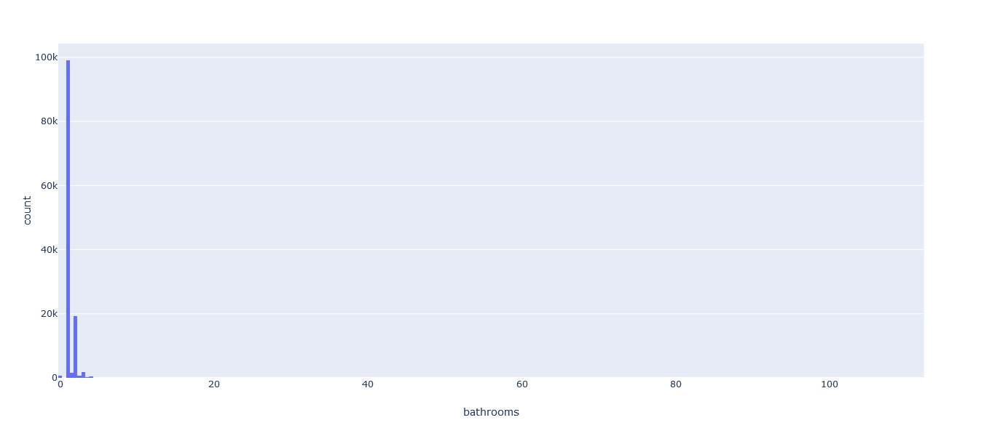

In [29]:
px.histogram(df, x = 'bathrooms')

Оказывается есть какие-то ванные комнаты с половинками (1.5, 2.5 и тд.). Представляют ли они интерес в разрезе целевой переменной?

In [30]:
df['half_bathrooms'] = ((np.round(df.bathrooms) - df.bathrooms)!=0).astype(float)

In [31]:
df.groupby('interest_level').agg({'half_bathrooms':'count'})

,half_bathrooms
interest_level,
0,3839
1,11229
2,34284


как мы видим - да, ванные с половинками более привлекательны

думаю что нет смысла рассматривать квартиры с количесвом ванных более 4х или равными 0 (т.к. глянув описание я увидел что все-таки как минимум одна ванная там есть), это будут явно выбросы. Клипнем их

In [32]:
df['bathrooms'] = df.bathrooms.clip(1,4)

In [33]:
num_features.append('half_bathrooms')
X = df[num_features][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

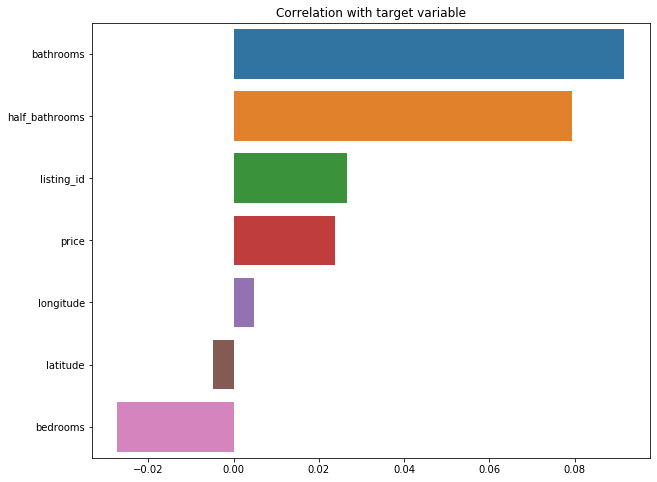

In [34]:
corr_plt(X,y)

Посмтрим помогло ли это

In [35]:
# xgb_score.append(runXGB(X, y))
# xgb_score

In [36]:
# rf_score.append(runRandomForest(X, y))
# rf_score

С XGBoost есть небольшой прирост, а вот лес наоборот ухудшился

### Теперь посмотрим на bedrooms

In [37]:
df.bedrooms.describe()

count    124011.000000
mean          1.543460
std           1.110203
min           0.000000
25%           1.000000
50%           1.000000
75%           2.000000
max           8.000000
Name: bedrooms, dtype: float64

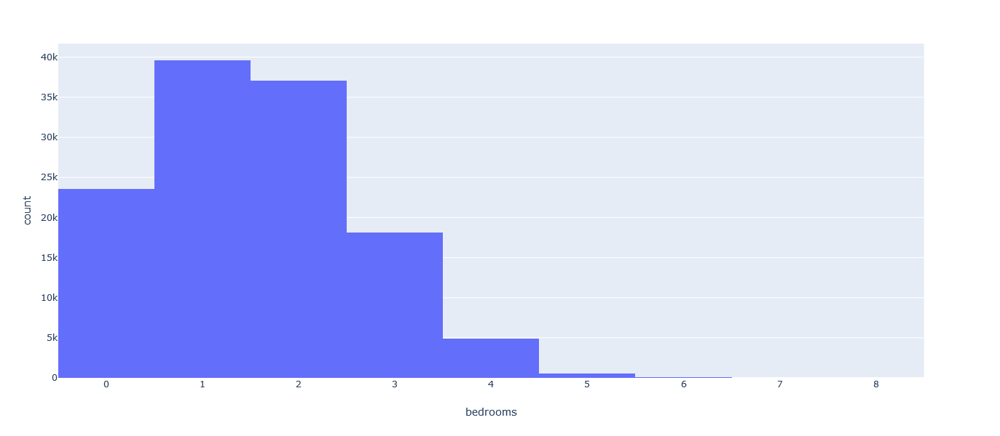

In [38]:
px.histogram(df, x = 'bedrooms')

ну вроде нормально тут все

### building_id

In [39]:
df.building_id.describe()

count     124011
unique     11635
top            0
freq       20664
Name: building_id, dtype: object

In [40]:
labelencoder = LabelEncoder()

In [41]:
df.building_id = labelencoder.fit_transform(df.building_id)

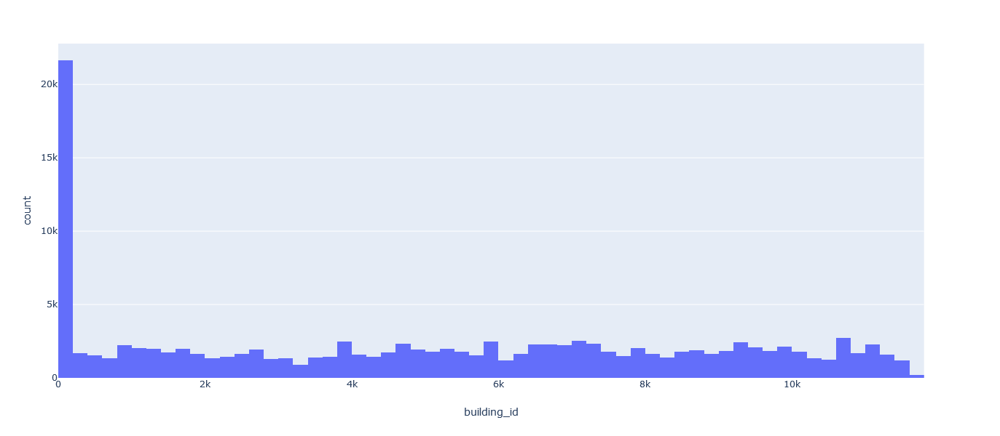

In [42]:
px.histogram(df, x = 'building_id', nbins=100)

In [43]:
df.loc[df.building_id == 0].count()

bathrooms          20664
bedrooms           20664
building_id        20664
created            20664
description        20664
display_address    20664
features           20664
latitude           20664
listing_id         20664
longitude          20664
manager_id         20664
photos             20664
price              20664
street_address     20664
interest_level      8286
half_bathrooms     20664
dtype: int64

Очень странно, то ли они сгруппированы, то ли что, но 20664 объявлений по одному зданию...

давайте глянем эти здания по координатам

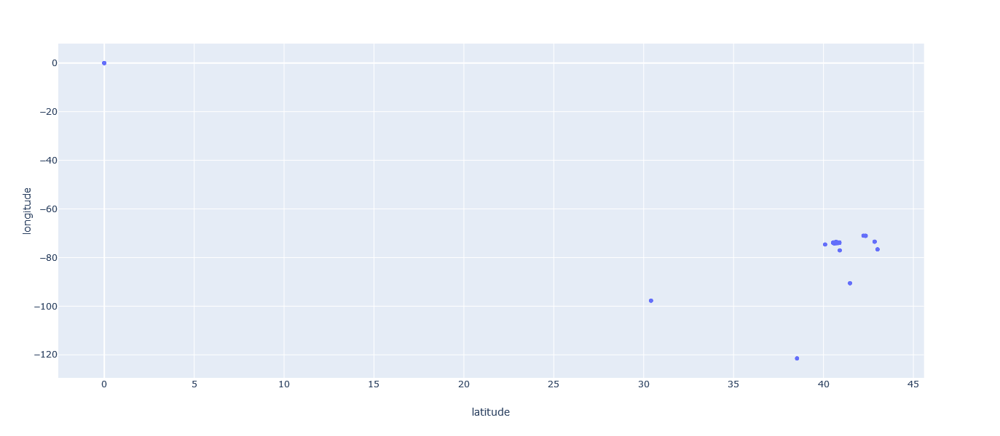

In [44]:
px.scatter(df.loc[df.building_id == 0], x = 'latitude', y = 'longitude')

видим что это разные здания, я не знаю по какому принципу их объединили.

In [45]:
df.loc[df.building_id == 0].groupby('interest_level').agg({'building_id':'count'})

,building_id
interest_level,
0,195
1,503
2,7588


In [46]:
df.groupby('interest_level').agg({'building_id':'count'})

,building_id
interest_level,
0,3839
1,11229
2,34284


как мы видим - есть небольшой перекос в сторону 1го класса.

In [47]:
num_features.append('building_id')

In [48]:
X = df[num_features][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

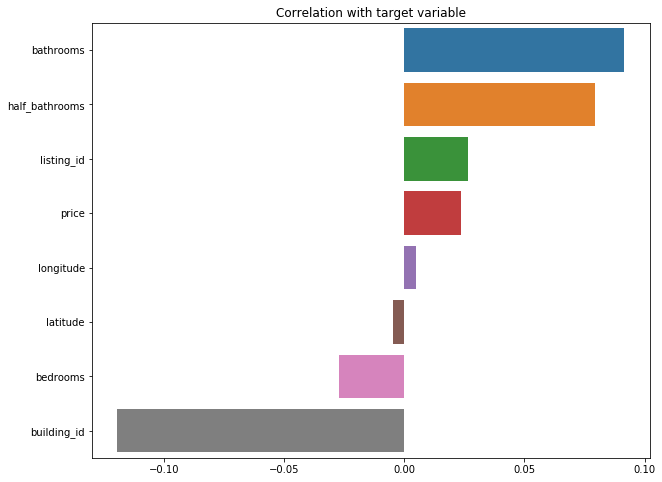

In [49]:
corr_plt(X,y)

In [50]:
# xgb_score.append(runXGB(X, y))
# xgb_score

In [51]:
# rf_score.append(runRandomForest(X, y))
# rf_score

вооот, этот признак дает уже хороший прирост

# created

так как это дата, то приведем его к формату даты и наинженерим признаков плюсом

In [52]:
df['created'] = pd.to_datetime(df['created'])

In [53]:
df.created.describe()

count                  124011
unique                 119722
top       2016-06-11 03:22:50
freq                        4
first     2016-04-01 22:12:41
last      2016-06-29 21:55:35
Name: created, dtype: object

In [54]:
df.created.describe()[0] - df.created.describe()[1]

4289

а не дубликаты ли это?

In [55]:
df.set_index('created').index.get_duplicates()

c:\users\user\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

'get_duplicates' is deprecated and will be removed in a future release. You can use idx[idx.duplicated()].unique() instead



DatetimeIndex(['2016-06-02 03:43:44', '2016-06-08 05:44:32',
               '2016-06-09 06:14:37', '2016-06-15 02:59:11',
               '2016-06-16 04:08:35', '2016-06-21 07:10:46',
               '2016-06-29 06:14:39', '2016-06-29 01:24:26',
               '2016-06-17 01:22:01', '2016-06-24 10:48:49',
               ...
               '2016-04-30 02:24:53', '2016-04-26 03:25:57',
               '2016-04-19 05:39:01', '2016-04-03 01:18:15',
               '2016-04-19 06:18:09', '2016-04-15 04:58:15',
               '2016-04-12 01:22:06', '2016-04-12 01:13:40',
               '2016-04-09 22:11:41', '2016-04-20 01:31:52'],
              dtype='datetime64[ns]', name='created', length=4069, freq=None)

In [56]:
df.loc[df.created == df.set_index('created').index.get_duplicates()[1]]

c:\users\user\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

'get_duplicates' is deprecated and will be removed in a future release. You can use idx[idx.duplicated()].unique() instead



,bathrooms,bedrooms,building_id,created,description,display_address,features,latitude,listing_id,longitude,manager_id,photos,price,street_address,interest_level,half_bathrooms
1036,1.0,1,4807,2016-06-08 05:44:32,"FEATURES: high ceilings, oak parquet floors, ...",Battery Place,"[Doorman, Elevator, Fitness Center, Laundry in...",40.7067,7126403,-74.018,2aa9bfa5f67ed9997ea341dee8a3a271,[https://photos.renthop.com/2/7126403_ebd29440...,2525,50 Battery Place,2,0.0
3727,2.0,2,1253,2016-06-08 05:44:32,THIS IS AN AMAZING DEAL NOW SHOWING AND WILL N...,East 102nd Street,"[Doorman, Elevator, Fitness Center, Laundry in...",40.7874,7126402,-73.942,9f39caedae295bf81e67463e6fd0af40,[https://photos.renthop.com/2/7126402_d95d968c...,2830,333 East 102nd Street,2,0.0


вроде нет, тогда дальше

In [57]:
df['created_month'] = df['created'].dt.month
df['created_day'] = df['created'].dt.day
df['created_hour'] = df['created'].dt.hour
df['created_minute'] = df['created'].dt.minute

In [58]:
num_features.extend(['created_month', 'created_day', 'created_hour', 'created_minute'])

In [59]:
X = df[num_features][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

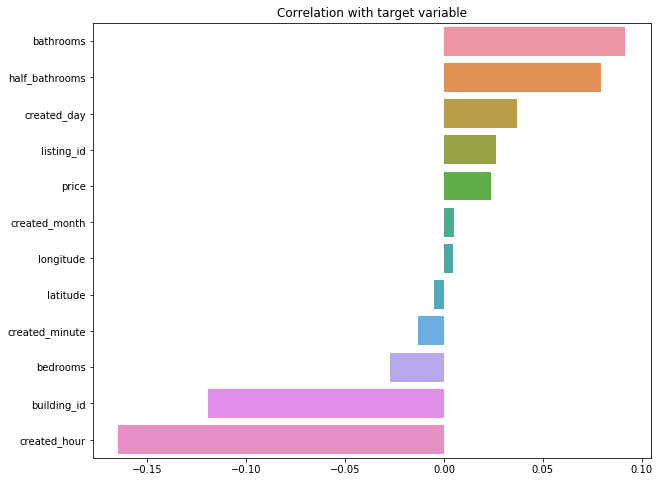

In [60]:
corr_plt(X,y)

In [61]:
# xgb_score.append(runXGB(X, y))
# xgb_score

In [62]:
# rf_score.append(runRandomForest(X, y))
# rf_score

уже лучше

# display_address

In [63]:
df.display_address.describe()

count       124011
unique       16068
top       Broadway
freq          1163
Name: display_address, dtype: object

In [64]:
df.display_address = labelencoder.fit_transform(df.display_address)

чисто теоретически можно еще посмотреть на сходство display_address и street_address, они ведь разные, может где они не совпадают, или совпадают частично, вероятность получить какой-то класс выше... оставлю на потом

In [65]:
num_features.extend(['display_address'])

In [66]:
X = df[num_features][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

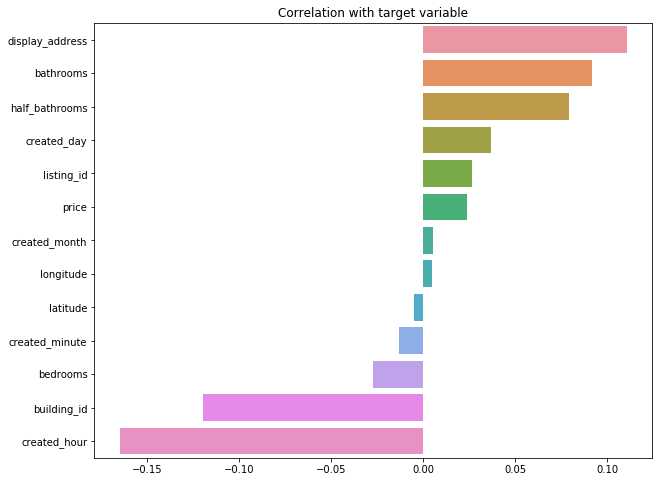

In [67]:
corr_plt(X,y)

In [68]:
# xgb_score.append(runXGB(X, y))
# xgb_score

In [69]:
# rf_score.append(runRandomForest(X, y))
# rf_score

ну не намного лучше, но все же

# latitude & longitude

In [70]:
# px.scatter(df, x = 'latitude', y = 'longitude', color='interest_level')

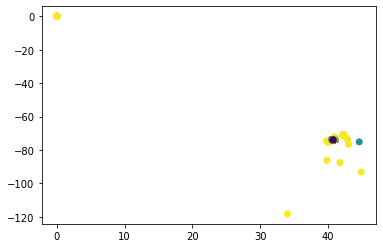

In [71]:
plt.scatter(df.latitude, df.longitude, c=df.interest_level)

видно что есть выбросы, пофиксим их

In [72]:
borders_latitude = np.percentile(df.latitude.values, q=[0.1, 99.9])
borders_latitude

array([40.5758, 40.892 ])

In [73]:
df['latitude'] = df.latitude.clip(borders_latitude[0], borders_latitude[1])

In [74]:
borders_longitude = np.percentile(df.longitude.values, q=[0.1, 99.9])
borders_longitude

array([-74.036499, -73.7366  ])

In [75]:
df['longitude'] = df.longitude.clip(borders_longitude[1], borders_longitude[0])

не факт конечно что это лучшее решение, но чем-то надо жертвовать. возможно замена выбросов модой или медианой даст лучший результат. надо будет проверить.

In [76]:
# px.scatter(df, x = 'latitude', y = 'longitude', color='interest_level')

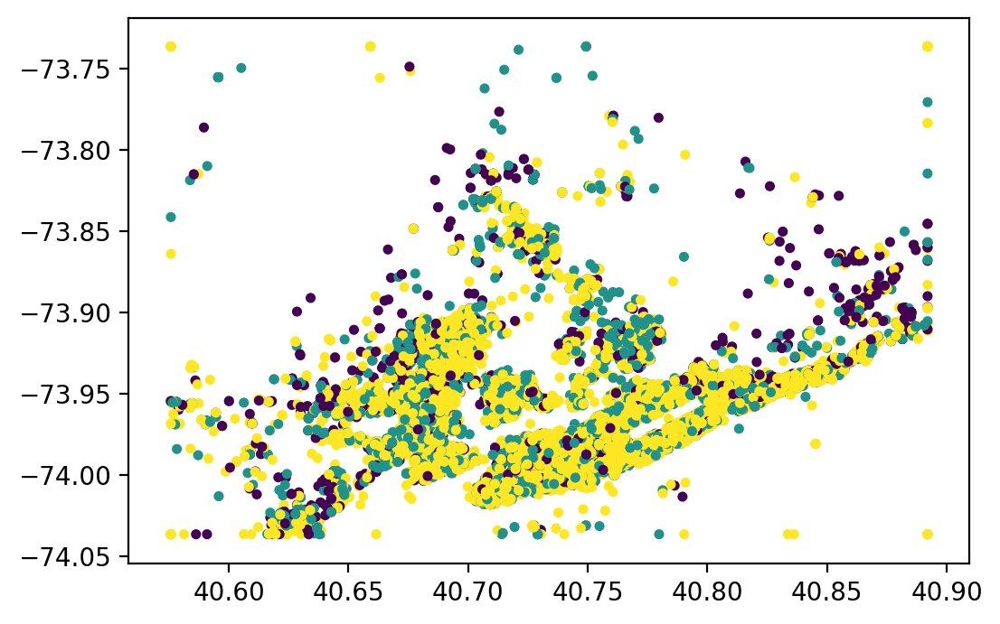

In [77]:
plt.subplots(dpi=200)
plt.scatter(df.latitude, df.longitude, c=df.interest_level, marker='.');

In [78]:
X = df[num_features][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

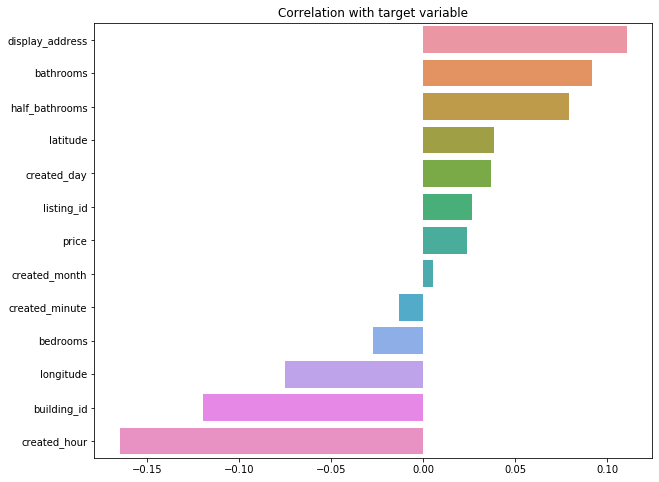

In [79]:
corr_plt(X,y)

In [80]:
# xgb_score.append(runXGB(X, y))
# xgb_score

In [81]:
# rf_score.append(runRandomForest(X, y))
# rf_score

всё лучше чем ничего

# photos

ну ничего умнее чем просто посчитать кол-во фото я не придумал, можно конечно их позагружать и обучить нейронку, возможно и будет толк

In [82]:
df["num_photos"] = df["photos"].apply(len)

In [83]:
features_to_use = list(df.columns.drop(['description', 'manager_id', 'photos', 'street_address', 'features', 'created', 'interest_level']))
# features_to_use

In [84]:
X = df[features_to_use][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

In [85]:
# xgb_score.append(runXGB(X, y))
# xgb_score

In [86]:
# rf_score.append(runRandomForest(X, y))
# rf_score

# street_address

In [87]:
df['street_address'] = labelencoder.fit_transform(df['street_address'])

In [88]:
features_to_use = list(df.columns.drop(['description', 'manager_id', 'photos', 'features', 'created', 'interest_level']))
# features_to_use

In [89]:
X = df[features_to_use][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

In [90]:
# xgb_score.append(runXGB(X, y))
# xgb_score

In [91]:
# rf_score.append(runRandomForest(X, y))
# rf_score

# этот признак только ухудшает модель, не будем его использовать

In [92]:
features_to_use = list(df.columns.drop(['description', 'manager_id', 'photos', 'street_address', 'features', 'created', 'interest_level']))
# features_to_use

# manager_id

In [93]:
df['manager_id'] = labelencoder.fit_transform(df['manager_id'])

In [94]:
features_to_use = list(df.columns.drop(['description', 'photos', 'street_address', 'features', 'created', 'interest_level']))
# features_to_use

In [95]:
X = df[features_to_use][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

In [96]:
# xgb_score.append(runXGB(X, y))
# xgb_score

In [97]:
# rf_score.append(runRandomForest(X, y))
# rf_score

# description

In [98]:
df["num_description_words"] = df["description"].apply(lambda x: len(x.split(" ")))

In [99]:
features_to_use = list(df.columns.drop(['description', 'photos', 'street_address', 'features', 'created', 'interest_level']))
# features_to_use

In [100]:
X = df[features_to_use][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

In [101]:
# xgb_score.append(runXGB(X, y))
# xgb_score

In [102]:
# rf_score.append(runRandomForest(X, y))
# rf_score

следущие признаки взяты отсюда https://www.kaggle.com/adamsfei/only-brand-new-features

In [103]:
def cap_share(x):
    return sum(1 for c in x if c.isupper())/float(len(x)+1)

In [104]:


# do you think that users might feel annoyed BY A DESCRIPTION THAT IS SHOUTING AT THEM?
df['num_cap_share'] = df['description'].apply(cap_share)

# how long in lines the desc is?
df['num_nr_of_lines'] = df['description'].apply(lambda x: x.count('<br /><br />'))

# is the description redacted by the website?        
df['num_redacted'] = 0
df['num_redacted'].ix[df['description'].str.contains('website_redacted')] = 1


# can we contact someone via e-mail to ask for the details?
df['num_email'] = 0
df['num_email'].ix[df['description'].str.contains('@')] = 1

#and... can we call them?

reg = re.compile(".*?(\(?\d{3}\D{0,3}\d{3}\D{0,3}\d{4}).*?", re.S)
def try_and_find_nr(description):
    if reg.match(description) is None:
        return 0
    return 1

df['num_phone_nr'] = df['description'].apply(try_and_find_nr)

c:\users\user\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:9: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated

c:\users\user\appdata\local\programs\python\python37\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\users\user\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:14: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated



In [105]:
features_to_use = list(df.columns.drop(['description', 'photos', 'street_address', 'features', 'created', 'interest_level']))
# features_to_use

In [106]:
X = df[features_to_use][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

In [107]:
# xgb_score.append(runXGB(X, y))
# xgb_score

In [108]:
# rf_score.append(runRandomForest(X, y))
# rf_score

# несколько новых признаков

In [109]:
def ratio(df):
    df["pricePerBed"] = df['price'] / df['bedrooms']
    df["pricePerBath"] = df['price'] / df['bathrooms']
    df["pricePerRoom"] = df['price'] / (df['bedrooms'] + df['bathrooms'])
    df["bedPerBath"] = df['bedrooms'] / df['bathrooms']
    df["bedBathDiff"] = df['bedrooms'] - df['bathrooms']
    df["bedBathSum"] = df["bedrooms"] + df['bathrooms']
    df["bedsPerc"] = df["bedrooms"] / (df['bedrooms'] + df['bathrooms'])
    return df


In [110]:
df = ratio(df)

In [111]:
features_to_use = list(df.columns.drop(['description', 'photos', 'street_address', 'features', 'created', 'interest_level']))
# features_to_use

In [112]:
X = df[features_to_use][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

In [113]:
xgb_score.append(runXGB(X, y))
xgb_score

c:\users\user\appdata\local\programs\python\python37\lib\site-packages\xgboost\core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version



[0]	train-mlogloss:1.03842	test-mlogloss:1.03945
Multiple eval metrics have been passed: 'test-mlogloss' will be used for early stopping.

Will train until test-mlogloss hasn't improved in 20 rounds.
[1]	train-mlogloss:0.986172	test-mlogloss:0.988486
[2]	train-mlogloss:0.940912	test-mlogloss:0.944087
[3]	train-mlogloss:0.903286	test-mlogloss:0.907237
[4]	train-mlogloss:0.868927	test-mlogloss:0.873843
[5]	train-mlogloss:0.839523	test-mlogloss:0.845405
[6]	train-mlogloss:0.813373	test-mlogloss:0.819872
[7]	train-mlogloss:0.790049	test-mlogloss:0.79761
[8]	train-mlogloss:0.769539	test-mlogloss:0.777959
[9]	train-mlogloss:0.752103	test-mlogloss:0.761322
[10]	train-mlogloss:0.736278	test-mlogloss:0.746486
[11]	train-mlogloss:0.721739	test-mlogloss:0.732486
[12]	train-mlogloss:0.708713	test-mlogloss:0.720157
[13]	train-mlogloss:0.696736	test-mlogloss:0.708963
[14]	train-mlogloss:0.686887	test-mlogloss:0.699766
[15]	train-mlogloss:0.677801	test-mlogloss:0.691384
[16]	train-mlogloss:0.669633	t

[0.630685684885116, 0.5630815873749312]

In [114]:
runCatboost(X, y)

0.5735172540576228

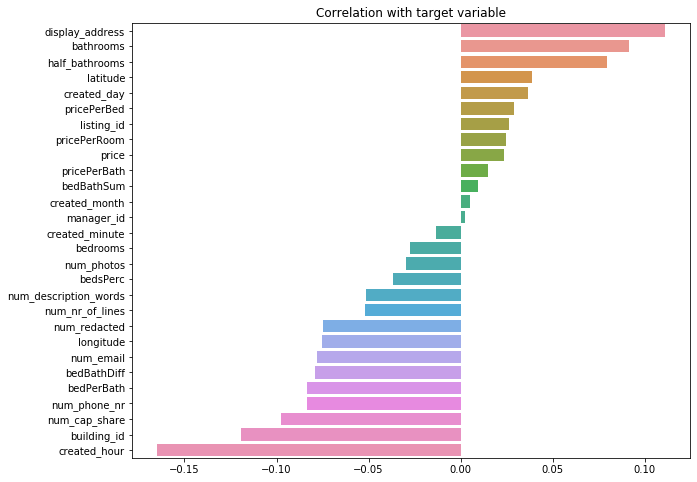

In [115]:
corr_plt(X,y)

# features

для начала тупо посчитаем кол-во характеристик

In [116]:
df["num_features"] = df["features"].apply(len)

In [117]:
df.shape

(124011, 35)

In [118]:
features_to_use = list(df.columns.drop(['description', 'manager_id', 'photos', 'street_address', 'features', 'created', 'interest_level']))
# features_to_use

In [119]:
X = df[features_to_use][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

In [120]:
# xgb_score.append(runXGB(X, y))
# xgb_score

In [121]:
# rf_score.append(runRandomForest(X, y))
# rf_score

In [122]:
df.shape

(124011, 35)

взглянем повнимательней что находится в этом признаке, идея взята из этого кернела https://www.kaggle.com/jxnlco/deduplicating-features

In [123]:
features = df[["features"]].apply(lambda _: [list(map(str.strip, map(str.lower, x))) for x in _])

In [124]:
features.head()

,features
4,"[dining room, pre-war, laundry in building, di..."
6,"[doorman, elevator, laundry in building, dishw..."
9,"[doorman, elevator, laundry in building, laund..."
10,[]
15,"[doorman, elevator, fitness center, laundry in..."


подсчитаем сколько уникальных характеристик в этом признаке

In [125]:
feature_counts = Counter()
for feature in features['features']:
    feature_counts.update(feature)
print(len(feature_counts))

2403


многовато, оставим только те, которые встречаются более n раз

In [126]:
n = 5

feature = sorted([k for (k,v) in feature_counts.items() if v > n])
print(len(feature))
feature[:5]

346


['$250 security deposit',
 '1 month free',
 '2 full baths',
 '24 hour concierge/doorman',
 '24 hour doorman']

In [127]:
def clean(s):
    x = s.replace("-", "")
    x = x.replace(" ", "")
    x = x.replace("twenty four hour", "24")
    x = x.replace("24/7", "24")
    x = x.replace("24hr", "24")
    x = x.replace("24-hour", "24")
    x = x.replace("24hour", "24")
    x = x.replace("24 hour", "24")
    x = x.replace("common", "cm")
    x = x.replace("concierge", "doorman")
    x = x.replace("bicycle", "bike")
    x = x.replace("private", "pv")
    x = x.replace("deco", "dc")
    x = x.replace("decorative", "dc")
    x = x.replace("onsite", "os")
    x = x.replace("outdoor", "od")
    x = x.replace("ss appliances", "stainless")
    x = x.replace("hi rise", "highrise")
    return x

In [128]:
key2original = defaultdict(list)
k = 4
for f in feature:
    cleaned = clean(f)
    key = cleaned[:k].strip()
    key2original[key].append(f)

In [129]:
len(key2original), len(feature)

(210, 346)

In [130]:
# key2original

итак, мы получили  наиболее повторяющиеся признаков, запихнем их в датафрейм

In [131]:
df.shape

(124011, 35)

In [ ]:
for n in tqdm(range(df.shape[0])):
    for i in df.iloc[n][6]:
        key = clean(i)[:k].strip().lower()
        if key in key2original.keys():
            if key not in df.columns:
                df[key] = 0
            df[key].iloc[n] = 1


In [132]:
df.shape

(124011, 35)

In [133]:
# df.to_csv('res.csv')

In [134]:
# df = pd.read_csv('res.csv')

In [135]:
features_to_use = list(df.columns.drop(['description', 'manager_id', 'photos', 'street_address', 'features', 'created', 'interest_level']))
# features_to_use

In [136]:
X = df[features_to_use][:train.shape[0]]
y = df['interest_level'][:train.shape[0]].astype(np.int64)

In [137]:
df['interest_level'][:train.shape[0]]

0        1.0
1        2.0
2        1.0
3        1.0
4        2.0
        ... 
49347    2.0
49348    1.0
49349    1.0
49350    1.0
49351    0.0
Name: interest_level, Length: 49352, dtype: float64

In [138]:
xgb_score.append(runXGB(X, y))
xgb_score

c:\users\user\appdata\local\programs\python\python37\lib\site-packages\xgboost\core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version



[0]	train-mlogloss:1.03525	test-mlogloss:1.03635
Multiple eval metrics have been passed: 'test-mlogloss' will be used for early stopping.

Will train until test-mlogloss hasn't improved in 20 rounds.
[1]	train-mlogloss:0.982653	test-mlogloss:0.985081
[2]	train-mlogloss:0.937559	test-mlogloss:0.940845
[3]	train-mlogloss:0.89753	test-mlogloss:0.901953
[4]	train-mlogloss:0.863268	test-mlogloss:0.868955
[5]	train-mlogloss:0.832838	test-mlogloss:0.839249
[6]	train-mlogloss:0.806858	test-mlogloss:0.814137
[7]	train-mlogloss:0.782854	test-mlogloss:0.79113
[8]	train-mlogloss:0.762764	test-mlogloss:0.771773
[9]	train-mlogloss:0.744411	test-mlogloss:0.754047
[10]	train-mlogloss:0.728867	test-mlogloss:0.739267
[11]	train-mlogloss:0.714446	test-mlogloss:0.725604
[12]	train-mlogloss:0.702008	test-mlogloss:0.713741
[13]	train-mlogloss:0.689397	test-mlogloss:0.701838
[14]	train-mlogloss:0.678407	test-mlogloss:0.69182
[15]	train-mlogloss:0.668985	test-mlogloss:0.68328
[16]	train-mlogloss:0.660024	test

[0.630685684885116, 0.5630815873749312, 0.5469718471426759]

In [139]:
# params = {'n_estimators':[200, 300, 500, 1000], 
#           'max_depth':[3, 5, 7, 10],
#           'learning_rate':[0.01, 0.05, 0.1]}

In [140]:
# cv=KFold(n_splits=5, random_state=42, shuffle=True)

In [141]:
# model_catb = catb.CatBoostClassifier(loss_function='MultiClass')
# rs = RandomizedSearchCV(model_catb, params, cv=cv, n_jobs=-1)
# rs.fit(X, y)

In [142]:
# rs.best_params_

In [143]:
runCatboost(X,y)

0.5502051334751022

разобьем обратно

In [155]:
train = df[:train.shape[0]]
test = df[train.shape[0]:]

In [156]:
del test['interest_level']

In [158]:
def runXGB(train_X, train_y, test_X, test_y=None, feature_names=None, seed_val=0, num_rounds=1000):
    param = {}
    param['objective'] = 'multi:softprob'
    param['eta'] = 0.1
    param['max_depth'] = 6
    param['silent'] = 1
    param['num_class'] = 3
    param['eval_metric'] = "mlogloss"
    param['min_child_weight'] = 1
    param['subsample'] = 0.7
    param['colsample_bytree'] = 0.7
    param['seed'] = seed_val
    num_rounds = num_rounds

    plst = list(param.items())
    xgtrain = xgb.DMatrix(train_X, label=train_y)

    if test_y is not None:
        xgtest = xgb.DMatrix(test_X, label=test_y)
        watchlist = [ (xgtrain,'train'), (xgtest, 'test') ]
        model = xgb.train(plst, xgtrain, num_rounds, watchlist, early_stopping_rounds=20)
    else:
        xgtest = xgb.DMatrix(test_X)
        model = xgb.train(plst, xgtrain, num_rounds)

    pred_test_y = model.predict(xgtest)
    return pred_test_y

In [160]:
X_train = train[features_to_use]
y_train = train['interest_level'].astype(np.int64)

In [164]:
X_train.dtypes.unique()

array([dtype('int64'), dtype('float64')], dtype=object)

In [165]:
X_test = test[features_to_use]

In [166]:


preds = runXGB(X_train, y_train, X_test, num_rounds=1000)
out_df = pd.DataFrame(preds)
out_df.columns = ["high", "medium", "low"]
out_df["listing_id"] = test.listing_id.values
# out_df.to_csv("xgb_starter2.csv", index=False)



c:\users\user\appdata\local\programs\python\python37\lib\site-packages\xgboost\core.py:587: FutureWarning:

Series.base is deprecated and will be removed in a future version

c:\users\user\appdata\local\programs\python\python37\lib\site-packages\xgboost\core.py:588: FutureWarning:

Series.base is deprecated and will be removed in a future version



In [167]:
out_df.head()

,high,medium,low,listing_id
0,0.054688,0.388071,0.557240,7142618
1,0.081916,0.031165,0.886919,7210040
2,0.000506,0.004594,0.994899,7174566
3,0.280409,0.231540,0.488051,7191391
4,0.004209,0.117595,0.878196,7171695


In [168]:
out_df.to_csv("ssv_preds.csv", index=False)